# Hamiltonianos 

In [1]:
using LinearAlgebra
using Plots

In [2]:
# Definición de las matrices de Pauli
id = [1.0 0; 0 1.0]
sigmax = [0 1.0; 1.0 0]
sigmay = [0 -im; im 0] 
sigmaz = [1.0 0; 0 -1.0]

2×2 Matrix{Float64}:
 1.0   0.0
 0.0  -1.0

In [3]:
#Así se define el producto tensorial
kron([sigmaz,id]...)

4×4 Matrix{Float64}:
 1.0  0.0   0.0   0.0
 0.0  1.0   0.0   0.0
 0.0  0.0  -1.0  -0.0
 0.0  0.0  -0.0  -1.0

In [4]:
sigmas = Dict(0=> id, 1=>sigmax, 2=>sigmay, 3=>sigmaz)

Dict{Int64, Matrix} with 4 entries:
  0 => [1.0 0.0; 0.0 1.0]
  2 => Complex{Int64}[0+0im 0-1im; 0+1im 0+0im]
  3 => [1.0 0.0; 0.0 -1.0]
  1 => [0.0 1.0; 1.0 0.0]

Se busca una función que dado un parametro $n$ que es el número de partículas y un dirección $x,y$ o $z$ en la que se mide el spin de la i-esima particula nos arroje $I\otimes I \otimes ... \otimes \sigma^i_{\{x,y,z\}} \otimes...\otimes I\otimes I$ donde $I$ aparece $n-1$ veces

In [5]:
# Definición del producto tensorial
function Pauli(indice, position, totalparticles)
    list = []
    for i in 1:totalparticles
        if i == position
            push!(list,sigmas[indice])
        else 
            push!(list,sigmas[0])
        end
    end
    return kron(list...)
end

Pauli (generic function with 1 method)

In [6]:
Pauli(3,1,2)

4×4 Matrix{Float64}:
 1.0  0.0   0.0   0.0
 0.0  1.0   0.0   0.0
 0.0  0.0  -1.0  -0.0
 0.0  0.0  -0.0  -1.0

Razón de que se cruzaran antes, El hamiltoniano del modelo de Ising tiene la siguient simetría

$PHP=H$ donde $P=\prod_{i=1}^N \sigma_i^x = \bigotimes_{i=1}^N \sigma^x$ 

Se puede sacar los eigevectores para uno de los eigenvalores y luego se obtiene un nuevo hamiltoniano del tipo

$<v_n|H|v_m>$

In [7]:
function parity(particles)
    list = [sigmas[1] for _ in 1:particles]
    return kron(list...)
end

parity (generic function with 1 method)

In [8]:
parity(4)

16×16 Matrix{Float64}:
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  …  0.0  0.0  0.0  0.0  0.0  0.0  1.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  1.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  1.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  1.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  1.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  …  0.0  1.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     1.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  …  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  1.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  

In [9]:
vals, vecs = eigen(parity(4))

Eigen{Float64, Float64, Matrix{Float64}, Vector{Float64}}
values:
16-element Vector{Float64}:
 -0.9999999999999989
 -0.9999999999999989
 -0.9999999999999989
 -0.9999999999999989
 -0.9999999999999989
 -0.9999999999999989
 -0.9999999999999989
 -0.9999999999999989
  1.0
  1.0
  1.0
  1.0
  1.0
  1.0
  1.0
  1.0
vectors:
16×16 Matrix{Float64}:
  0.0        0.0        0.0        0.0       …  0.0       0.0       0.707107
  0.707107   0.0        0.0        0.0          0.0       0.0       0.0
  0.0        0.0        0.0        0.0          0.707107  0.0       0.0
  0.0        0.707107   0.0        0.0          0.0       0.0       0.0
  0.0        0.0        0.0        0.0          0.0       0.0       0.0
  0.0        0.0        0.707107   0.0       …  0.0       0.0       0.0
  0.0        0.0        0.0        0.0          0.0       0.0       0.0
  0.0        0.0        0.0        0.707107     0.0       0.707107  0.0
  0.0        0.0        0.0       -0.707107     0.0       0.707107  0.0
  0.0

Si este operador es una simetría del Hamiltoniano, podemos diagonalizar el Hamiltoniano por bloques de paridad.

In [10]:
# Para filtrar todos los eigenvectores con eigenvalor 1, hacemos lo siguiente para encontrar los índices
@show findall(vals .== 1)

findall(vals .== 1) = [9, 10, 11, 12, 13, 14, 15, 16]


8-element Vector{Int64}:
  9
 10
 11
 12
 13
 14
 15
 16

In [11]:
#O simplemente dentro de la matriz de eigenvectores
vec = vecs[:, findall(vals .< 0)]

16×8 Matrix{Float64}:
  0.0        0.0        0.0       …   0.0        0.0       -0.707107
  0.707107   0.0        0.0           0.0        0.0        0.0
  0.0        0.0        0.0           0.0       -0.707107   0.0
  0.0        0.707107   0.0           0.0        0.0        0.0
  0.0        0.0        0.0          -0.707107   0.0        0.0
  0.0        0.0        0.707107  …   0.0        0.0        0.0
  0.0        0.0        0.0           0.0        0.0        0.0
  0.0        0.0        0.0           0.0        0.0        0.0
  0.0        0.0        0.0           0.0        0.0        0.0
  0.0        0.0        0.0           0.0        0.0        0.0
  0.0        0.0       -0.707107  …   0.0        0.0        0.0
  0.0        0.0        0.0           0.707107   0.0        0.0
  0.0       -0.707107   0.0           0.0        0.0        0.0
  0.0        0.0        0.0           0.0        0.707107   0.0
 -0.707107   0.0        0.0           0.0        0.0        0.0
  0.0        

In [12]:
vec = vecs[:, findall(vals .> 0)]

16×8 Matrix{Float64}:
 0.0       0.0       0.0       0.0       …  0.0       0.0       0.707107
 0.707107  0.0       0.0       0.0          0.0       0.0       0.0
 0.0       0.0       0.0       0.0          0.707107  0.0       0.0
 0.0       0.0       0.0       0.0          0.0       0.0       0.0
 0.0       0.0       0.0       0.707107     0.0       0.0       0.0
 0.0       0.0       0.707107  0.0       …  0.0       0.0       0.0
 0.0       0.707107  0.0       0.0          0.0       0.0       0.0
 0.0       0.0       0.0       0.0          0.0       0.707107  0.0
 0.0       0.0       0.0       0.0          0.0       0.707107  0.0
 0.0       0.707107  0.0       0.0          0.0       0.0       0.0
 0.0       0.0       0.707107  0.0       …  0.0       0.0       0.0
 0.0       0.0       0.0       0.707107     0.0       0.0       0.0
 0.0       0.0       0.0       0.0          0.0       0.0       0.0
 0.0       0.0       0.0       0.0          0.707107  0.0       0.0
 0.707107  0.0       

# Ejercicios

## 1 

*   Diagonalizar por bloques el Hamiltoniano de Ising con Js aleatorias. Es decir, teniendo los eigenvectores con un eigenvalor de paridad determinado, digamos $\{|v_i>\}$, donde $P|v_i>=|v_i>$, el bloque del Hamiltoniano es simplemente $H^+_{ij}=<v_i|H|v_j>$, donde el $+$ indica que es el bloque con paridad positiva.
*   Graficar de nuevo el espectro respecto al campo $b$, pero ahora con los eigenvalores de diferente paridad con diferente color (claramente tendremos solo dos colores).

Modelo de Ising $H=-J\sum_i \sigma_i \sigma_{i+1} -h \sum_i S_i$

In [13]:
# En un campo externo h 
function Ising(N,J,h; cerrada = false) #Keyword Arguments
    H = 0
    totalparticulas = N
    if cerrada == false 
        M = (N - 1)
    elseif cerrada == true 
        M = N 
    end

    for i in 0:(M-1)
        H = H .+ J*(Pauli(3, mod(i,N),totalparticulas)*Pauli(3,mod((i+1),N),totalparticulas))
    end
    for j in 0:N-1
        H = H .+ h*Pauli(1,j,totalparticulas)
    end
    return H 
end

Ising (generic function with 1 method)

In [14]:
N = 5 # Número de partículas 
J = 0.5 #interacción entre partículas
b_values = 0:0.001:1 # rango para el campo externo
list = []
for b in b_values
     Ham = Ising(N,J,b,cerrada = false)
     Vals = eigen(Ham).values
     append!(list,map(x->[b,x],Vals))
end

In [15]:
list
x_list = [l[1] for l in list]
y_list = [l[2] for l in list]

32032-element Vector{Float64}:
 -2.0
 -2.0
 -1.0
 -1.0
 -1.0
 -1.0
 -1.0
 -1.0
 -1.0
 -1.0
  ⋮
  2.447786796649364
  2.8204298003768096
  2.8204298003768096
  3.377556270411521
  3.3775562704115223
  3.9895108152295844
  3.9895108152295875
  5.317641841333642
  5.317641841333643

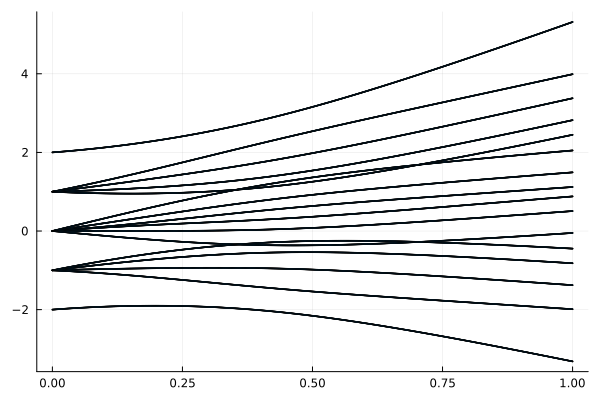

In [16]:
scatter(x_list,y_list, label = false, markersize = 0.5)
# Con el campo se rompe la simetría esférica (se rompe la degeneración)

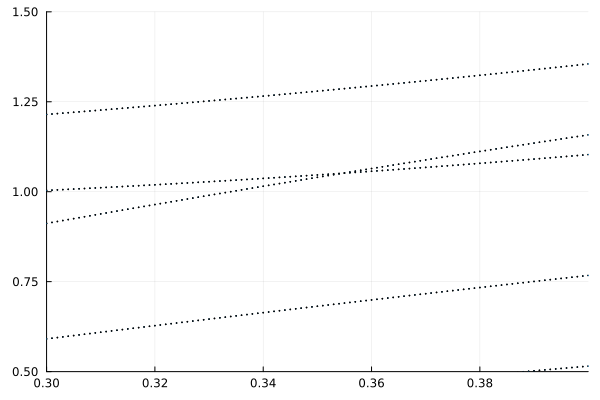

In [17]:
# Las trayectorias de eigenvalores no deberían cruzarse pero no es tán evidente
scatter(x_list,y_list, label = false, markersize = 0.5)
xlims!(0.3,0.4)
ylims!(0.5,1.5)

$H=-\sum_i J_i \sigma_i^z \sigma_{i+1}^z+b\sum \sigma_i^x$ tal que $J_i \sim U([1-\epsilon, 1+\epsilon])$ y $z\sim U([0,1])$

In [18]:
function Ising_Random(N,h, j_vec; cerrada = false) #Keyword Arguments
    H = 0
    totalparticulas = N
    if cerrada == false 
        M = (N - 1)
    elseif cerrada == true 
        M = N 
    end
    
    for i in 0:(M-1)
        H = H .+ j_vec[i+1]*(Pauli(3, mod(i,N)+1,totalparticulas)*Pauli(3,mod((i+1),N)+1,totalparticulas))
    end
    for j in 0:N-1
        H = H .+ h*Pauli(1,j+1,totalparticulas)
    end
    return H 
end

Ising_Random (generic function with 1 method)

In [34]:
ϵ = 0.1
N = 4
j_vec = rand(N)*2*ϵ .-ϵ .+ 1 #Por pasos: primero rand() da un número entre 0 y 1, 
#luego se multiplica por 2*ϵ y esto da un número entre 0 y 2ϵ,
# se le resta ϵ y esto da un número entre -ϵ y ϵ,
#, finalmente se le suma 1 y esto da un número entre 1-ϵ y 1+ϵ :)
Ising_Random(N,1.0,j_vec; cerrada = false)

16×16 Matrix{Float64}:
 3.11843  1.0        1.0      0.0      …   0.0      0.0       0.0
 1.0      0.931046   0.0      1.0          0.0      0.0       0.0
 1.0      0.0       -1.05276  1.0          0.0      0.0       0.0
 0.0      1.0        1.0      1.13463      0.0      0.0       0.0
 1.0      0.0        0.0      0.0          0.0      0.0       0.0
 0.0      1.0        0.0      0.0      …   1.0      0.0       0.0
 0.0      0.0        1.0      0.0          0.0      1.0       0.0
 0.0      0.0        0.0      1.0          0.0      0.0       1.0
 1.0      0.0        0.0      0.0          0.0      0.0       0.0
 0.0      1.0        0.0      0.0          1.0      0.0       0.0
 0.0      0.0        1.0      0.0      …   0.0      1.0       0.0
 0.0      0.0        0.0      1.0          0.0      0.0       1.0
 0.0      0.0        0.0      0.0          1.0      1.0       0.0
 0.0      0.0        0.0      0.0         -1.05276  0.0       1.0
 0.0      0.0        0.0      0.0          0.0      0

In [35]:
# Función para proyectar el Hamiltoniano en la base de paridad
function project_hamiltonian(H, particles, sign)
    vals, vecs = eigen(parity(particles))
    H_proy = zeros(2^(particles-1),2^(particles-1))	

    # Bloques correspondientes a eigenvalores positivos y negativos
    if sign == 1
        vec = vecs[:, findall(vals .> 0)]
        elseif sign == -1
            vec = vecs[:, findall(vals .< 0)]
    end

    for i in 1:size(vec)[2]
        for j in 1:size(vec)[2]
            H_proy[i,j] = vec[:,i]' * H * vec[:,j]
        end
    end

    return H_proy
end

project_hamiltonian (generic function with 1 method)

In [36]:
H= Ising_Random(N, 0.5, j_vec)
project_hamiltonian(H, N, 1)

8×8 Matrix{Float64}:
 0.931046   0.5       0.5       0.0       0.5       0.0      0.0      0.5
 0.5       -1.13463   0.0       0.5       0.0       0.5      0.5      0.0
 0.5        0.0      -3.11843   0.5       0.0       0.5      0.5      0.0
 0.0        0.5       0.5      -0.931046  0.5       0.0      0.0      0.5
 0.5        0.0       0.0       0.5       1.13463   0.5      0.5      0.0
 0.0        0.5       0.5       0.0       0.5      -1.05276  0.0      0.5
 0.0        0.5       0.5       0.0       0.5       0.0      1.05276  0.5
 0.5        0.0       0.0       0.5       0.0       0.5      0.5      3.11843

In [37]:
project_hamiltonian(H, N, -1)

8×8 Matrix{Float64}:
  0.931046   0.5       0.5       0.0      …   0.0        0.0      -0.5
  0.5        1.13463   0.0       0.5          0.5       -0.5       0.0
  0.5        0.0      -3.11843   0.5         -0.5        0.5       0.0
  0.0        0.5       0.5       1.05276      0.0        0.0       0.5
  0.5        0.0       0.0      -0.5          0.5        0.5       0.0
  0.0        0.5      -0.5       0.0      …  -0.931046   0.0       0.5
  0.0       -0.5       0.5       0.0          0.0       -1.05276   0.5
 -0.5        0.0       0.0       0.5          0.5        0.5       3.11843

In [38]:
list = []
for h in 0:0.01:2
     ham = Ising_Random(N,h,j_vec,cerrada = true)
     Ham_proy = project_hamiltonian(ham, N, 1)
     Vals = eigen(Ham_proy).values
     append!(list,map(x->[h,x],Vals))
end

In [39]:
list
x_list_random = [l[1] for l in list]
y_list_random = [l[2] for l in list]

1608-element Vector{Float64}:
 -4.20776682716015
 -0.15828619037911043
 -0.04530150158609981
 -0.03657617461347251
  0.03657617461347251
  0.04530150158609981
  0.15828619037911043
  4.20776682716015
 -4.207861963633149
 -0.15967751995713364
  ⋮
  8.569702118678526
 -8.606192680353853
 -2.7665865545856985
 -0.11485840924028956
 -0.00040354079712895787
  0.00040354079712566666
  0.114858409240302
  2.7665865545856843
  8.60619268035388

In [40]:
list2 = []
for h in 0:0.01:2
     ham = Ising_Random(N,h,j_vec,cerrada = true)
     Ham_proy = project_hamiltonian(ham, N, -1)
     Vals = eigen(Ham_proy).values
     append!(list2,map(x->[h,x],Vals))
end

In [41]:
list2
x_list_random2 = [l[1] for l in list2]
y_list_random2 = [l[2] for l in list2]

1608-element Vector{Float64}:
 -4.20776682716015
 -0.15828619037911043
 -0.04530150158609981
 -0.03657617461347251
  0.03657617461347251
  0.04530150158609981
  0.15828619037911043
  4.20776682716015
 -4.207861958257259
 -0.1596548269240028
  ⋮
  6.606575667064802
 -6.624269776235314
 -4.025048641357452
 -3.978350132434352
 -2.4134021261552903
  2.4134021261552876
  3.978350132434361
  4.025048641357467
  6.6242697762353036

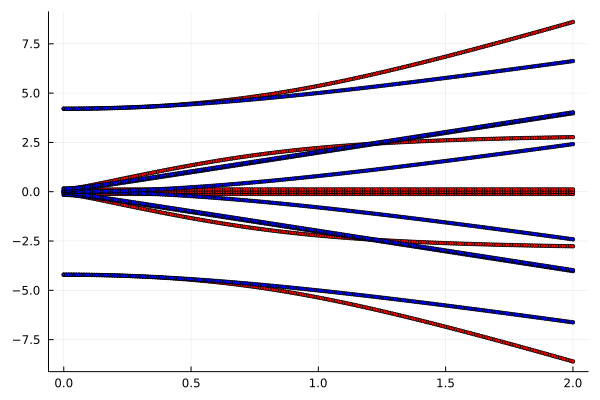

In [42]:
scatter(x_list_random,y_list_random, color =:red, label = false, markersize = 2)
scatter!(x_list_random2,y_list_random2, color =:blue, label = false, markersize = 2)

## 2

*   Definir el operador de traslación de qubits. Es decir, considerando una cadena cerrada, definan el operador $K$ tal que $K|000100>=|000010>$, etc. La idea de este operador es que las etiquetas de los qubits se mapen, por ejemplo, de la siguiente forma $i \rightarrow i+1$.

In [4]:
# Primero definimos algunas funciones auxiliares que nos ayudarán a convertir de un número a una lista de bits y viceversa.
function original_integer(list)
    return parse(Int, join(list); base=2)
end

function base_2(integer; pad= nothing)
    if pad == nothing
        return reverse(digits(integer, base = 2))
    else
        return reverse(digits(integer, base = 2, pad = pad))
    end
end

base_2 (generic function with 1 method)

In [55]:
original_integer([0,0,0,1,0,0])

4

In [54]:
original_integer([0,0,0,0,1,0])

2

In [31]:
function rotate(index, particles)
    vec = base_2(index, pad = particles)
    return original_integer([vec[end]; vec[1:end-1]])
end

rotate (generic function with 1 method)

In [56]:
base_2(4, pad = 6)

6-element Vector{Int64}:
 0
 0
 0
 1
 0
 0

In [57]:
base_2(rotate(4,6), pad = 6)

6-element Vector{Int64}:
 0
 0
 0
 0
 1
 0

# Ejercicios
## 1
Crear la función `merge_two_integers` utilizando los operadores bit-wise mostrados arriba.
Testear la función y asegurarse de que funcione correctamente.
## 2
Crear una función que se llame `apply_qubit_unitary(u,target,particles)` utilizando `merge_two_integers`. Esta nueva función deberá aplicar una unitaria de $2 \times 2$ al qubit target.

https://geekmonkey.org/lwm-julia-bitwise-operators/

In [ ]:
mask = original_integer([0,1,1,0,0])
a = original_integer([1,1])
b = original_integer([1,0,1])
mask, a , b

(12, 3, 5)

In [48]:
2^0

1

In [39]:
original_integer([1,1,1,0,1])

29

In [ ]:
# Notemos que 1 en binario será [...,0,0,0,1] por lo que 
# [...,i_3,i_2,i_1,i_0] & 1 solo puede ser 0 o 1 según i_0 sea 1 o 0
max_len = 5 #numero de particulas
result = 0

for i in 1:max_len

    if mask & 1 == 1
        bit = a & 1
        result = result | bit
        new_mask = mask >> i
        new_a = a >> i
    elseif mask & 1 == 0
        bit = b & 1
        result = result | bit
        new_mask = mask >> i
        new_b = b >> i
    end
end

result
    

1